# 3 Exploratory Data Analysis<a id='3_Exploratory_Data_Analysis'></a>

## 3.1 Contents<a id='3.1_Contents'></a>
* [3 Exploratory Data Analysis](#3_Exploratory_Data_Analysis)
  * [3.1 Contents](#3.1_Contents)
  * [3.2 Introduction](#3.2_Introduction)
  * [3.3 Imports](#3.3_Imports)
  * [3.4 Load The Data](#3.4_Load_The_Data)
    * [3.4.1 HR data](#3.4.1_HR_data)
    * [3.4.2 Missing values check](#3.4.2_Missing_values_check)
  * [3.5 Explore The Data](#3.5_Explore_The_Data)
    * [3.5.1 Heatmap](#3.5.1_Heatmap)
      * [3.5.1.1 Encode Variables](#3.5.1.1_Encode_Variables)
      * [3.5.1.2 Correlation Heatmap](#3.5.1.2_Correlation_Heatmap)
    * [3.5.2 Departments By Order Of Each Of The Summary Statistics](#3.5.2_Departments_By_Order_Of_Each_Of_The_Summary_Statistics)
    * [3.5.3 Age based Analysis](#3.5.3_Age_based_Analysis)
    * [3.5.4 Visulization of other feature](#3.5.4_Visulization_of_other_features)
  * [3.6 Save encoded dataframe](#3.6_Save_encoded_dataframe)  
  * [3.7 Summary](#3.7_Summary) 

 
    

## 3.2 Introduction<a id='3.2_Introduction'></a>

At this point, we have a firm idea of what data science problem is and have the data that could help solve it. The business problem was a general one of modeling job satisfaction levels. The data contained four levels of satisfaction level based on four unique values in Job Satisfaction column. After performing data wrangling we understood there is no missing value, and no column and row dropped. 

The data science problem we subsequently identified is to predict the job satisfaction level based on various factors.
How Job Satisfaction related to other features like Business Travel, Depatment, EducationField, Gender, Marital Status, Over18 and OverTime? Does OverTime increase Job Satisfaction? Is there a relation between BusinessTravel and Job Satisfaction?

## 3.3 Imports<a id='3.3_Imports'></a>

In [2]:
#Import pandas, matplotlib.pyplot, and seaborn
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder

#from library.sb_utils import save_file

## 3.4 Load The Data<a id='3.4_Load_The_Data'></a>

### 3.4.1 HR data<a id='3.4.1_HR_data'></a>

In [3]:
# the supplied CSV data file is the data directory
hr_data = pd.read_csv('../data/HR-Employee-data.csv')

In [3]:
#Call the describe method to see a summary of the data
hr_data.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [4]:
 #Call the columns method to pring columns names and head method to print the first several rows of the data
print(hr_data.columns)
hr_data.head()


Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')


,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [5]:
# Find data type of all the columns
hr_data.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

### 3.4.2 Missing values check<a id='3.4.2_Missing_values_check'></a>

In [6]:
# Find null values
hr_data.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [7]:
#Find duplicate rows
hr_data.duplicated().sum()

0

There is no missing value in dataframe and no row is duplicated.

## 3.5 Explore The Data<a id='3.5_Explore_The_Data'></a>

## 3.5.1 Heatmap to see correlation between columns.<a id='3.5.1_Heatmap'></a>
Note: Heatmap only show coorelation for Numeric columns. To see correlation of categorical columns, first  get dummies for categorical features and then create heatmap

### 3.5.1.1 Encode categorical variables<a id='3.5.1.1_Encode_Variables'></a>

In [10]:
# Get a list of categorical variables
cat_cols = hr_data.select_dtypes(include=['object']).columns.tolist()
cat_cols 

['Attrition',
 'BusinessTravel',
 'Department',
 'EducationField',
 'Gender',
 'JobRole',
 'MaritalStatus',
 'Over18',
 'OverTime']

In [4]:
# Using get_dummies to convert categorical variables to numerical labels
hr_data_dummies = hr_data.copy()
hr_data_dummies = pd.get_dummies(hr_data_dummies)
hr_data_dummies.head()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes
0,41,1102,1,2,1,1,2,94,3,2,...,0,0,1,0,0,0,1,1,0,1
1,49,279,8,1,1,2,3,61,2,2,...,0,1,0,0,0,1,0,1,1,0
2,37,1373,2,2,1,4,4,92,2,1,...,0,0,0,0,0,0,1,1,0,1
3,33,1392,3,4,1,5,4,56,3,1,...,0,1,0,0,0,1,0,1,0,1
4,27,591,2,1,1,7,1,40,3,1,...,0,0,0,0,0,1,0,1,1,0


In [9]:
hr_data_dummies.columns

Index(['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome',
       'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StandardHours',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager', 'Attrition_No',
       'Attrition_Yes', 'BusinessTravel_Non-Travel',
       'BusinessTravel_Travel_Frequently', 'BusinessTravel_Travel_Rarely',
       'Department_Human Resources', 'Department_Research & Development',
       'Department_Sales', 'EducationField_Human Resources',
       'EducationField_Life Sciences', 'EducationField_Marketing',
       'EducationField_Medical', 'EducationField_Other',
       'EducationField_Technical Degree', 'Gen

In [10]:
hr_data_dummies.dtypes

Age                                  int64
DailyRate                            int64
DistanceFromHome                     int64
Education                            int64
EmployeeCount                        int64
EmployeeNumber                       int64
EnvironmentSatisfaction              int64
HourlyRate                           int64
JobInvolvement                       int64
JobLevel                             int64
JobSatisfaction                      int64
MonthlyIncome                        int64
MonthlyRate                          int64
NumCompaniesWorked                   int64
PercentSalaryHike                    int64
PerformanceRating                    int64
RelationshipSatisfaction             int64
StandardHours                        int64
StockOptionLevel                     int64
TotalWorkingYears                    int64
TrainingTimesLastYear                int64
WorkLifeBalance                      int64
YearsAtCompany                       int64
YearsInCurr

### 3.5.1.2 Correlation Heatmap <a id='3.5.1.2_Correlation_Heatmap'></a>


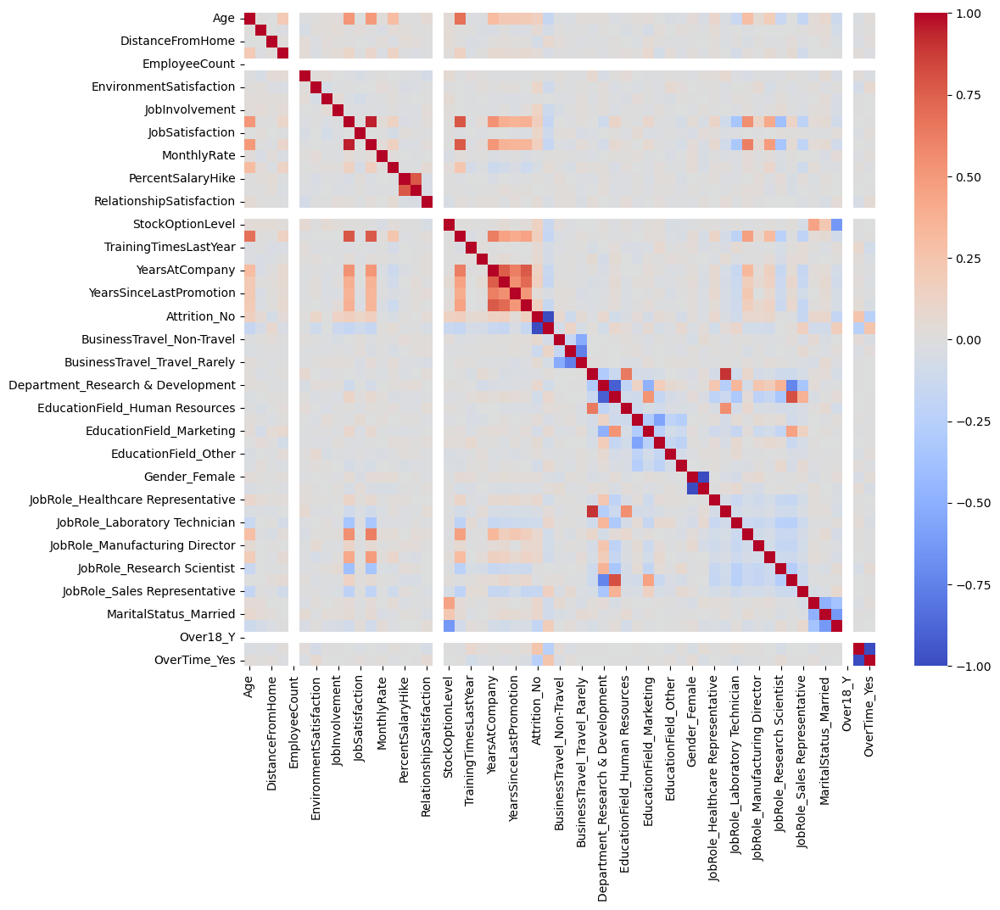

In [13]:
# Creating heatmap with all the columns, including encoded columns
plt.subplots(figsize=(12,10))
sns.heatmap(hr_data_dummies.corr(), cmap='coolwarm');

Categorical columns coorelation: \


Numerical columns coorelation: \
JobLevel and MonthlyIncome are highly correlated. \
Other positively correlated columns:\
Joblevel, TotalWorkingYears, MonthlyIncome and Age.
YearsAtCompany, YearsInCurrentRole, YearsSinceLastPromotion, YearsWithCurrManager.

Target column JobSatisfaction is not coorelated to any column in dataset.

In [14]:
#hr_data.corr(method='pearson', min_periods=1, numeric_only=False).round(2)
corr_matrix = hr_data_dummies.corr().abs().round(2)
corr_matrix

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes
Age,1.00,0.01,0.00,0.21,NaN,0.01,0.01,0.02,0.03,0.51,...,0.19,0.15,0.00,0.18,0.03,0.08,0.12,NaN,0.03,0.03
DailyRate,0.01,1.00,0.00,0.02,NaN,0.05,0.02,0.02,0.05,0.00,...,0.00,0.00,0.00,0.01,0.04,0.04,0.08,NaN,0.01,0.01
DistanceFromHome,0.00,0.00,1.00,0.02,NaN,0.03,0.02,0.03,0.01,0.01,...,0.02,0.01,0.03,0.02,0.01,0.03,0.03,NaN,0.03,0.03
Education,0.21,0.02,0.02,1.00,NaN,0.04,0.03,0.02,0.04,0.10,...,0.05,0.00,0.05,0.09,0.00,0.00,0.00,NaN,0.02,0.02
EmployeeCount,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EmployeeNumber,0.01,0.05,0.03,0.04,NaN,1.00,0.02,0.04,0.01,0.02,...,0.01,0.02,0.02,0.01,0.03,0.05,0.04,NaN,0.02,0.02
EnvironmentSatisfaction,0.01,0.02,0.02,0.03,NaN,0.02,1.00,0.05,0.01,0.00,...,0.05,0.00,0.02,0.00,0.02,0.02,0.01,NaN,0.07,0.07
HourlyRate,0.02,0.02,0.03,0.02,NaN,0.04,0.05,1.00,0.04,0.03,...,0.03,0.02,0.01,0.02,0.01,0.04,0.03,NaN,0.01,0.01
JobInvolvement,0.03,0.05,0.01,0.04,NaN,0.01,0.01,0.04,1.00,0.01,...,0.02,0.05,0.01,0.03,0.02,0.03,0.05,NaN,0.00,0.00
JobLevel,0.51,0.00,0.01,0.10,NaN,0.02,0.00,0.03,0.01,1.00,...,0.41,0.39,0.13,0.22,0.04,0.05,0.09,NaN,0.00,0.00


In [15]:
# select upper traingle of correlation matrix
upper_corr = corr_matrix.where(np.triu(np.ones(corr_matrix.shape)).astype(np.bool))
upper_corr

/var/folders/d3/wkz7rc595x94t818s1tjzxkm0000gn/T/ipykernel_5757/2955447180.py:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  upper_corr = corr_matrix.where(np.triu(np.ones(corr_matrix.shape)).astype(np.bool))


,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes
Age,1.0,0.01,0.0,0.21,NaN,0.01,0.01,0.02,0.03,0.51,...,0.19,0.15,0.00,0.18,0.03,0.08,0.12,NaN,0.03,0.03
DailyRate,NaN,1.00,0.0,0.02,NaN,0.05,0.02,0.02,0.05,0.00,...,0.00,0.00,0.00,0.01,0.04,0.04,0.08,NaN,0.01,0.01
DistanceFromHome,NaN,NaN,1.0,0.02,NaN,0.03,0.02,0.03,0.01,0.01,...,0.02,0.01,0.03,0.02,0.01,0.03,0.03,NaN,0.03,0.03
Education,NaN,NaN,NaN,1.00,NaN,0.04,0.03,0.02,0.04,0.10,...,0.05,0.00,0.05,0.09,0.00,0.00,0.00,NaN,0.02,0.02
EmployeeCount,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EmployeeNumber,NaN,NaN,NaN,NaN,NaN,1.00,0.02,0.04,0.01,0.02,...,0.01,0.02,0.02,0.01,0.03,0.05,0.04,NaN,0.02,0.02
EnvironmentSatisfaction,NaN,NaN,NaN,NaN,NaN,NaN,1.00,0.05,0.01,0.00,...,0.05,0.00,0.02,0.00,0.02,0.02,0.01,NaN,0.07,0.07
HourlyRate,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.00,0.04,0.03,...,0.03,0.02,0.01,0.02,0.01,0.04,0.03,NaN,0.01,0.01
JobInvolvement,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.00,0.01,...,0.02,0.05,0.01,0.03,0.02,0.03,0.05,NaN,0.00,0.00
JobLevel,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.00,...,0.41,0.39,0.13,0.22,0.04,0.05,0.09,NaN,0.00,0.00


In [16]:
to_drop = [column for column in upper_corr.columns if any(upper_corr[column] > 0.99)]
to_drop

['Age',
 'DailyRate',
 'DistanceFromHome',
 'Education',
 'EmployeeNumber',
 'EnvironmentSatisfaction',
 'HourlyRate',
 'JobInvolvement',
 'JobLevel',
 'JobSatisfaction',
 'MonthlyIncome',
 'MonthlyRate',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'PerformanceRating',
 'RelationshipSatisfaction',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager',
 'Attrition_No',
 'Attrition_Yes',
 'BusinessTravel_Non-Travel',
 'BusinessTravel_Travel_Frequently',
 'BusinessTravel_Travel_Rarely',
 'Department_Human Resources',
 'Department_Research & Development',
 'Department_Sales',
 'EducationField_Human Resources',
 'EducationField_Life Sciences',
 'EducationField_Marketing',
 'EducationField_Medical',
 'EducationField_Other',
 'EducationField_Technical Degree',
 'Gender_Female',
 'Gender_Male',
 'JobRole_Healthcare Representative',
 'JobRole_Human Resources',
 'Job

### 3.5.2 Deapartments by order of Each of The Summary Statistics<a id='3.5.2_Departments_By_Order_Of_Each_Of_The_Summary_Statistics'></a>

What does the department-wide picture look like?

In [17]:
Dept_count = hr_data['Department'].value_counts()
Dept_count


Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64

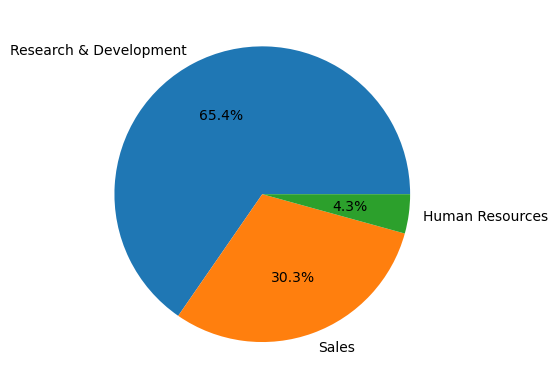

In [18]:
Dept_list = ["Research & Development", "Sales", "Human Resources"]
plt.pie(Dept_count, labels = Dept_list, autopct='%1.1f%%' )
plt.show()

In this dataset, majority of employees are in Research and Development department (65.4%), and Sales has 30.3% and Human Resources has 4.3%.

### Research and Development department analysis

In [19]:
Research = hr_data[hr_data['Department'] == 'Research & Development']


In [20]:
Research_count = Research['JobSatisfaction'].value_counts()
Research_count

3    300
4    295
1    192
2    174
Name: JobSatisfaction, dtype: int64

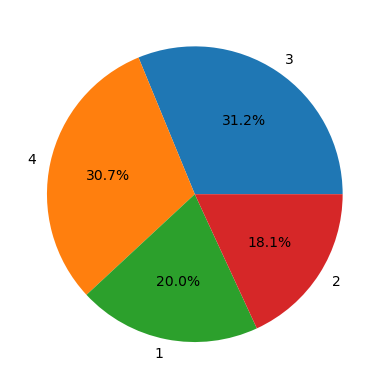

In [21]:
Res_list = [3,4,1,2]
plt.pie(Research_count, labels = Res_list, autopct='%1.1f%%' )
plt.show()

In Research & Development 62% employees chose job satisfaction level 3 or 4, means they are satisfied from job and 38% chose 1 or 2 level, which means they are not satisfied from their job.

### Sales department analysis


In [22]:
Sales = hr_data[hr_data['Department'] == 'Sales']

In [23]:
Sales_count = Sales['JobSatisfaction'].value_counts()
Sales_count

4    147
3    127
1     86
2     86
Name: JobSatisfaction, dtype: int64

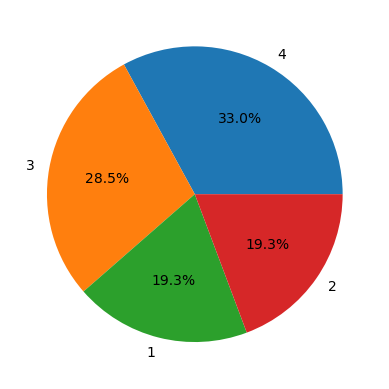

In [26]:
Sales_list = [4,3,1,2]
plt.pie(Sales_count, labels = Sales_list, autopct='%1.1f%%' )
plt.show()

In Sales 61% employees chose job satisfaction level 3 or 4, means they are satisfied from job and 39% chose 1 or 2 level, which means they are not satisfied from their job.

### Human Resources department analysis

In [27]:
Human_Resources = hr_data[hr_data['Department'] == 'Human Resources']
Human_Resources_count = Human_Resources['JobSatisfaction'].value_counts()
Human_Resources_count

2    20
4    17
3    15
1    11
Name: JobSatisfaction, dtype: int64

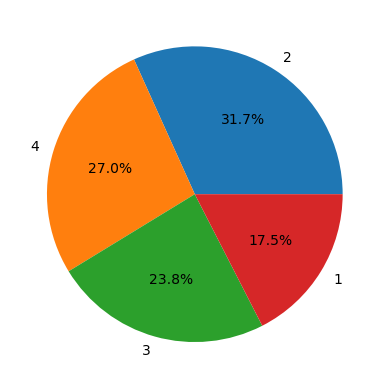

In [28]:
Human_Resources_list = [2,4,3,1]
plt.pie(Human_Resources_count, labels = Human_Resources_list, autopct='%1.1f%%' )
plt.show()

Human Resources is a small department with least number of employes (63). In Human Resources 51% employees chose job satisfaction level 3 or 4, means they are satisfied from job and 49% chose 1 or 2 level, which means they are not satisfied from their job.

## 3.5.3 Age based Analysis <a id='3.5.2_Age_based_Analysis'></a>

In [29]:
hr_data['Age'].min() ,  hr_data['Age'].max()

(18, 60)

Minimum age is 18 and maximum age is 60. 


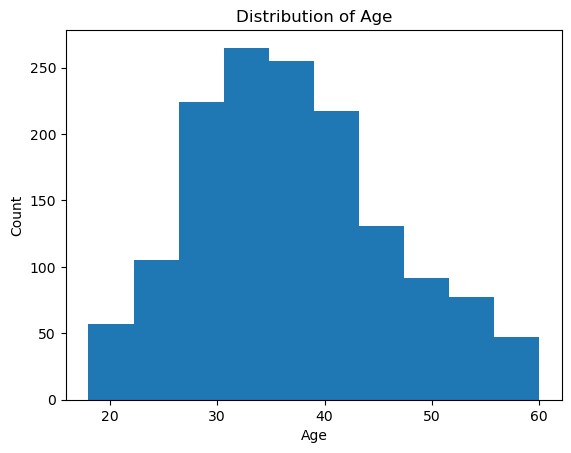

In [30]:
# Plot histogram to see which age group employees are more in the company
plt.hist(hr_data['Age'], bins = 10)
plt.title('Distribution of Age')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

Majority of employees are falling between age group 28 to 42.

In [31]:
age_range = hr_data.loc[(hr_data['Age'] >= 28) & (hr_data['Age'] <= 42), 'Age']
print(age_range.count())

881


Out of 1470 employees, 881 employees belong to age group 28 to 42.

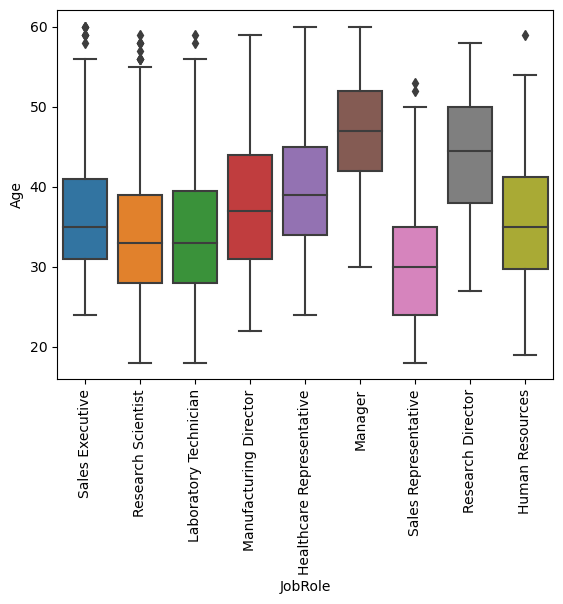

In [32]:
# Which Education field employees spend more years in the company

sns.boxplot(x= "JobRole", y = "Age", data = hr_data)

plt.xlabel('JobRole')
plt.ylabel('Age')
plt.xticks(rotation=90)
plt.show()

Employees with age more than 40 are at Manager and Director roles

## 3.5.4 Visulization of other features <a id='3.5.4_Visulization_of_other_features'></a>

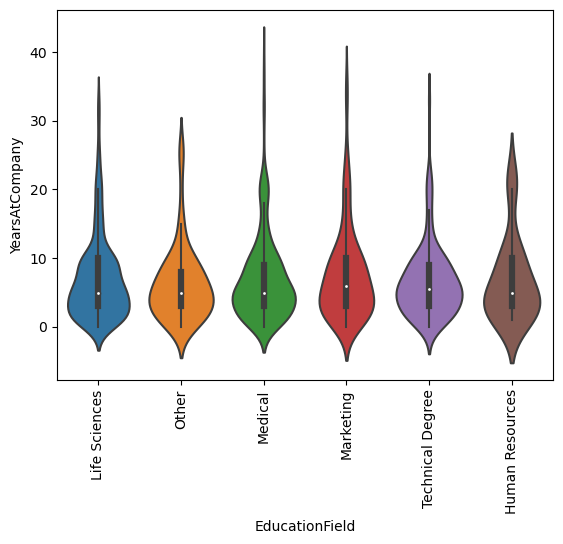

In [33]:
# Which Education field employees spend more years in the company

sns.violinplot(x= "EducationField", y = "YearsAtCompany", data = hr_data)

plt.xlabel('EducationField')
plt.ylabel('YearsAtCompany')
plt.xticks(rotation=90)
plt.show()

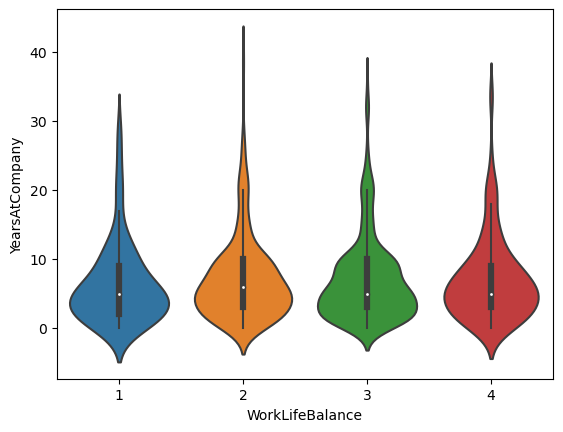

In [34]:
sns.violinplot(x= "WorkLifeBalance", y = "YearsAtCompany", data = hr_data)

plt.xlabel('WorkLifeBalance')
plt.ylabel('YearsAtCompany')
#plt.xticks(rotation=90)
plt.show()

Employees with all the education fields stay with company mostly 10 years. Some Medical and Marketing employees stay upto 40 years.

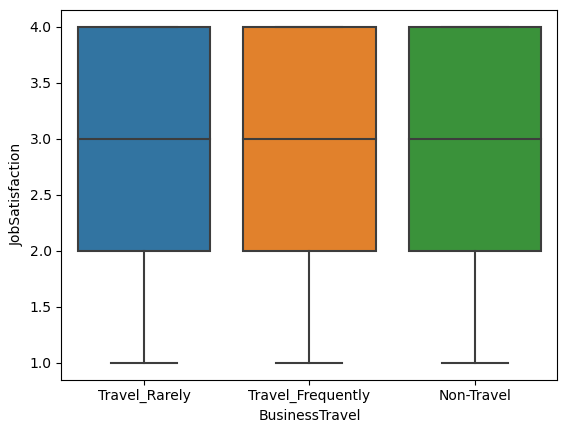

In [35]:
sns.boxplot(x= "BusinessTravel", y = "JobSatisfaction", data = hr_data)

plt.xlabel("BusinessTravel")
plt.ylabel("JobSatisfaction")
plt.show()

BusinessTravel doesn't effect JobSatisfaction. Both employees who Travel and who are not travelling have similar level of job satisfaction.

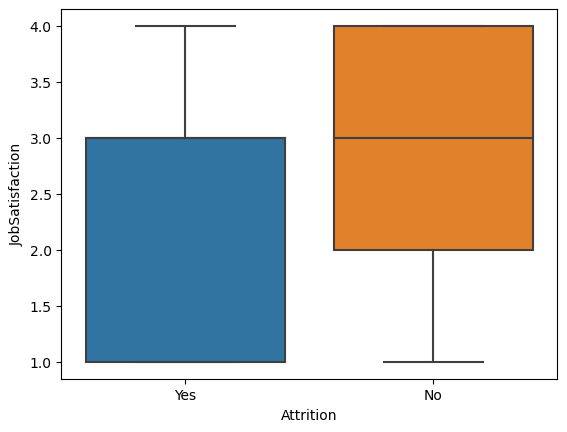

In [36]:
sns.boxplot(x= "Attrition", y = "JobSatisfaction", data = hr_data)

plt.xlabel('Attrition')
plt.ylabel("JobSatisfaction")
plt.show()

Employees with Attrition = yes have low job satisfaction. 

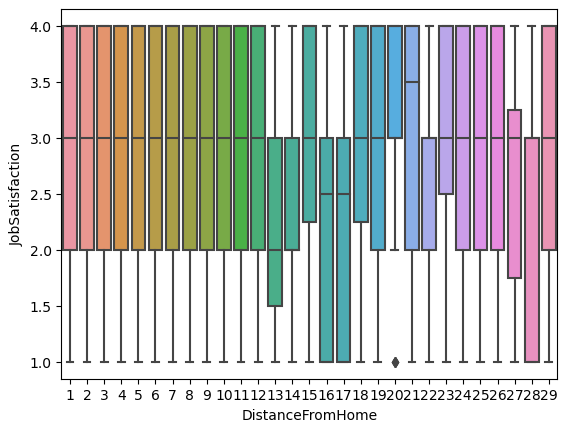

In [37]:

sns.boxplot(x= "DistanceFromHome", y = "JobSatisfaction", data = hr_data)

plt.xlabel("DistanceFromHome")
plt.ylabel("JobSatisfaction")
plt.show()

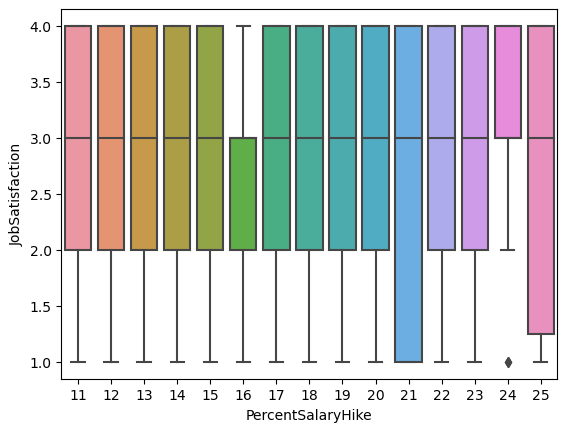

In [38]:
sns.boxplot(x= "PercentSalaryHike", y = "JobSatisfaction", data = hr_data)

plt.xlabel('PercentSalaryHike')
plt.ylabel("JobSatisfaction")
plt.show()

All the salary hike levels have similar job satisfaction except 16% (lower than 3 satisfaction level), and 21% have employees

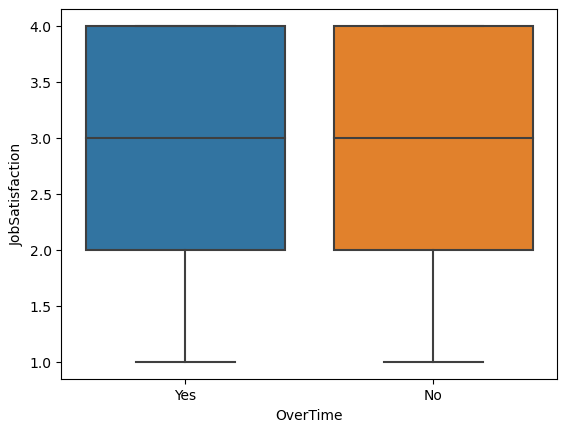

In [39]:
sns.boxplot(x= "OverTime", y = "JobSatisfaction", data = hr_data)

plt.xlabel('OverTime')
plt.ylabel("JobSatisfaction")
plt.show()

OverTime doesn't effect JobSatisfaction. Both employees who selected Yes and who selected No have similar level of job satisfaction.

## 3.6 Save encoded dataframe <a id='3.6_Save_encoded_dataframe'></a>

In [40]:
#Saving Encloded dataframe to csv
hr_data_dummies.to_csv('../data/hr_data_dummies.csv')

## 3.7 Summary <a id='3.6_Summary'></a>

In this dataset, majority of employees are in Research and Development department (65.4%), and Sales has 30.3% and Human Resources has 4.3%. In Sales 61% employees chose job satisfaction level 3 or 4, means they are satisfied from job and 39% chose 1 or 2 level, which means they are not satisfied from their job. Human Resources is a small department with least number of employes (63). In Human Resources 51% employees chose job satisfaction level 3 or 4, means they are satisfied from job and 49% chose 1 or 2 level, which means they are not satisfied from their job.
Minimum age is 18 and maximum age is 60. Majority of employees are falling between age group 28 to 42. Out of 1470 employees, 881 employees belong to age group 28 to 42.
Employees with all the education fields stay with company mostly 10 years. Some Medical and Marketing employees stay upto 40 years. BusinessTravel doesn't affect JobSatisfaction. Both employees who Travel and who are not travelling have similar level of job satisfaction. Employees with Attrition = yes have low job satisfaction. 


In [49]:
sns.pairplot(hr_data, corner=False)

In [39]:
# define useful function to create scatterplots of ticket prices against desired columns
def scatterplots(columns, ncol=None, figsize=(15, 8)):
    if ncol is None:
        ncol = len(columns)
    nrow = int(np.ceil(len(columns) / ncol))
    fig, axes = plt.subplots(nrow, ncol, figsize=figsize, squeeze=False)
    fig.subplots_adjust(wspace=0.5, hspace=0.6)
    for i, col in enumerate(columns):
        ax = axes.flatten()[i]
        ax.scatter(x = col, y = 'JobSatisfaction', data=hr_data, alpha=0.5)
        ax.set(xlabel=col, ylabel='Job Satisfaction')
    nsubplots = nrow * ncol    
    for empty in range(i+1, nsubplots):
        axes.flatten()[empty].set_visible(False)

In [40]:
features = [feature for feature in hr_data.columns if feature not in ['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'Over18', 'OverTime', 'JobSatisfaction']]

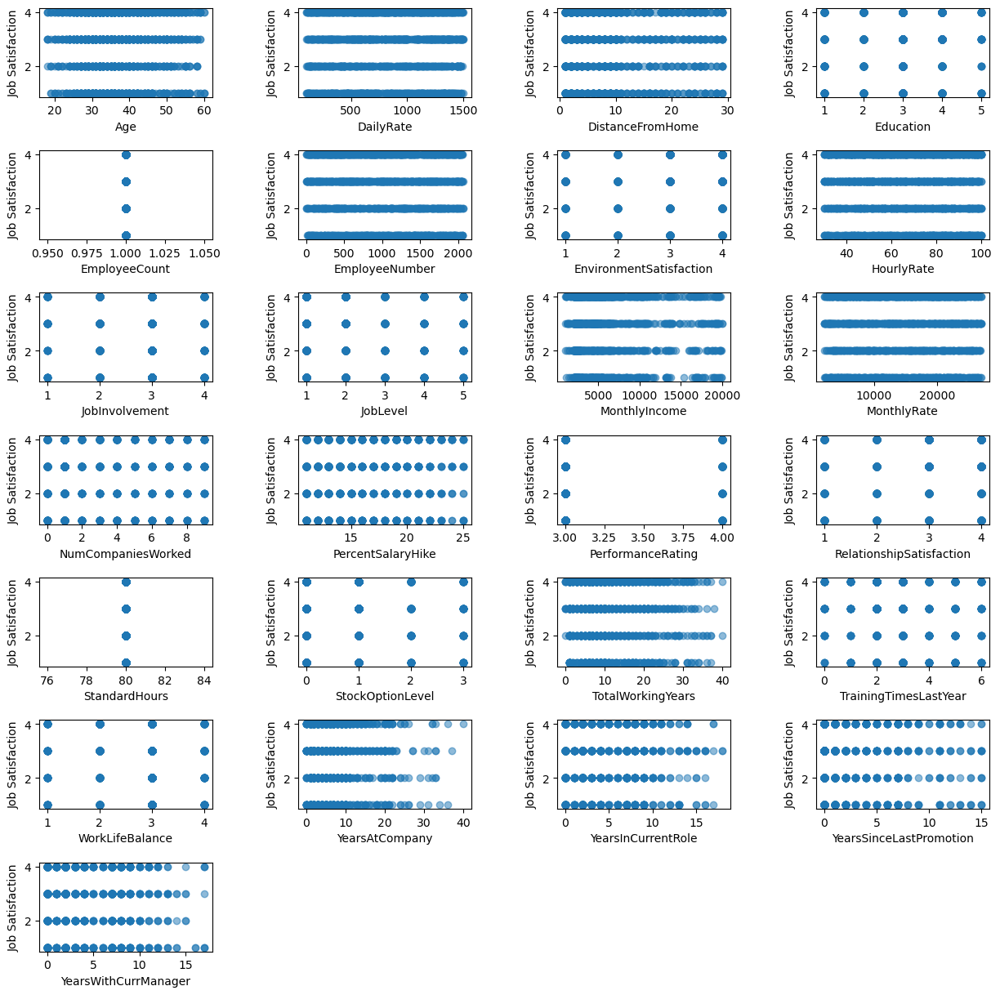

In [41]:
scatterplots(features, ncol=4, figsize=(15, 15))

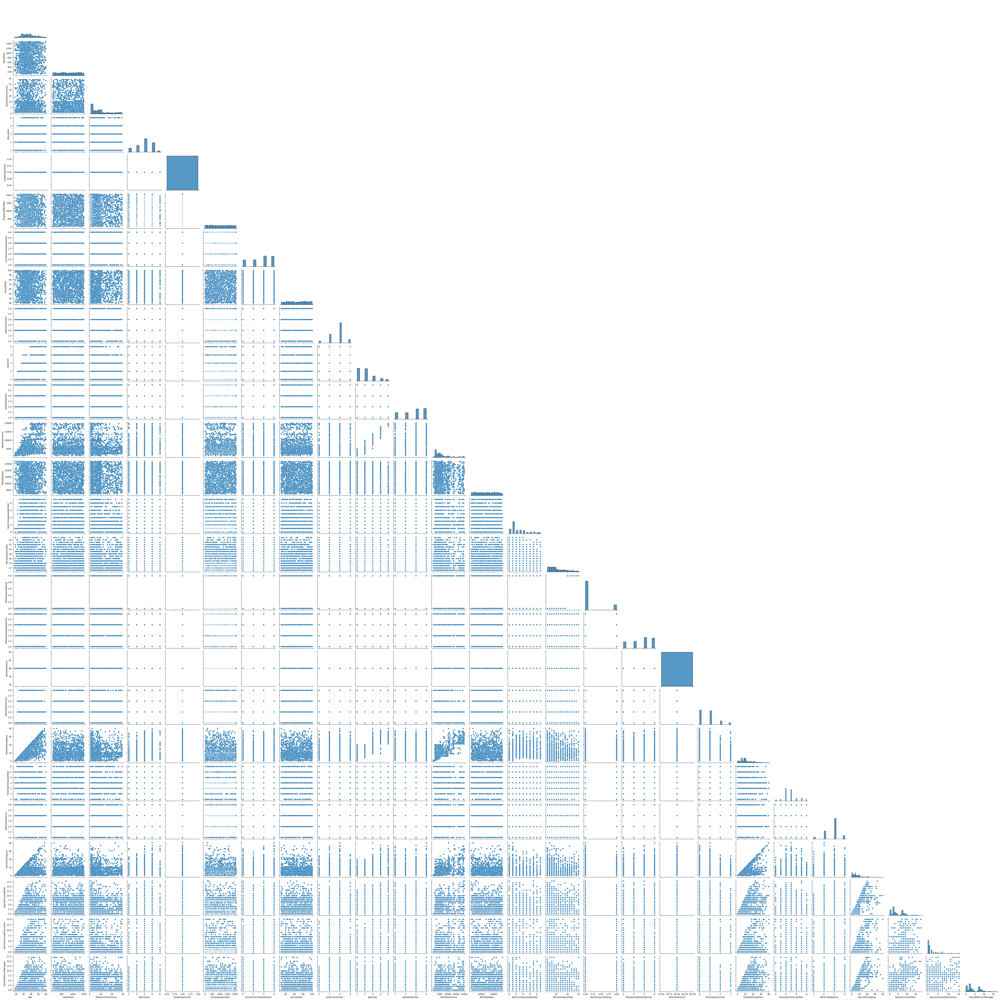

In [24]:
sns.pairplot(hr_data, corner=True)